In [1]:
recon_dir='F:\\2D_Imaging_UH3_Proposal\\1mm_15sources_100mW_1ms_1\\Splitted_Clipped_image\\stanford_cars\\cars_train'
groundTruth_dir='C:\\Users\\dsi224\\Documents\\PythonFiles\\PythonCodesForDiffusionModel\\stanford_cars\\cars_train'
recon_dir_t='F:\\2D_Imaging_UH3_Proposal\\1mm_15sources_100mW_1ms_1\\Splitted_Clipped_image\\stanford_cars\\cars_test'

In [2]:
import os
import torch
import torchvision
from torch.utils.data import Dataset,DataLoader
from torchvision.io import read_image
import torchvision.transforms as transforms
from PIL import Image

import matplotlib.pyplot as plt

import torch.nn.functional as F

import numpy as np

from torch import nn
import math
import random

from torch.optim import Adam

In [3]:
class CustomImageDataset(Dataset):
    def __init__(self, img_dir, transform=None, target_transform=None):
        self.img_list = [name for name in os.listdir(img_dir) if os.path.isfile(os.path.join(img_dir, name))]
        self.img_list = [name for name in self.img_list if name[-3:]=="jpg"]
        self.img_dir = img_dir
        self.transform = transform
        self.ToPILImage=transforms.ToPILImage()
        self.target_transform = target_transform

    def __len__(self):
        return len(self.img_list)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.img_list[idx])
        #image = read_image(img_path)
        image = Image.open(img_path).convert("RGB")
        label = int(self.img_list[idx][:-4])
        if self.transform:
            image = self.transform(image)
        #else:
        #    image=self.ToPILImage(image)
                
        if self.target_transform:
            label = self.target_transform(label)
        return image, label# Simulate forward diffusion

In [4]:
reconstructed = CustomImageDataset(img_dir=recon_dir)
reconstructed[0]

(<PIL.Image.Image image mode=RGB size=64x64 at 0x202F2603B20>, 1)

In [5]:
def show_images(dataset, num_samples=20, cols=4):
    """ Plots some samples from the dataset """

    plt.figure(figsize=(15,15)) 
    for i, img in enumerate(dataset):
        if i == num_samples:
            break
        plt.subplot(int(num_samples/cols) + 1, cols, i + 1)
        plt.imshow(img[0])

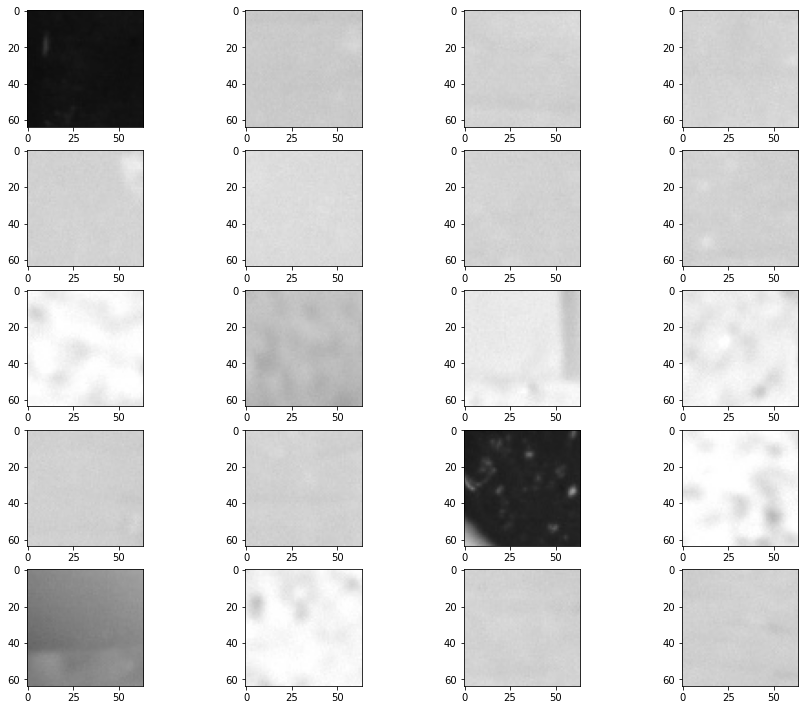

In [6]:
dataGroundTruth = CustomImageDataset(img_dir=groundTruth_dir)
show_images(dataGroundTruth)

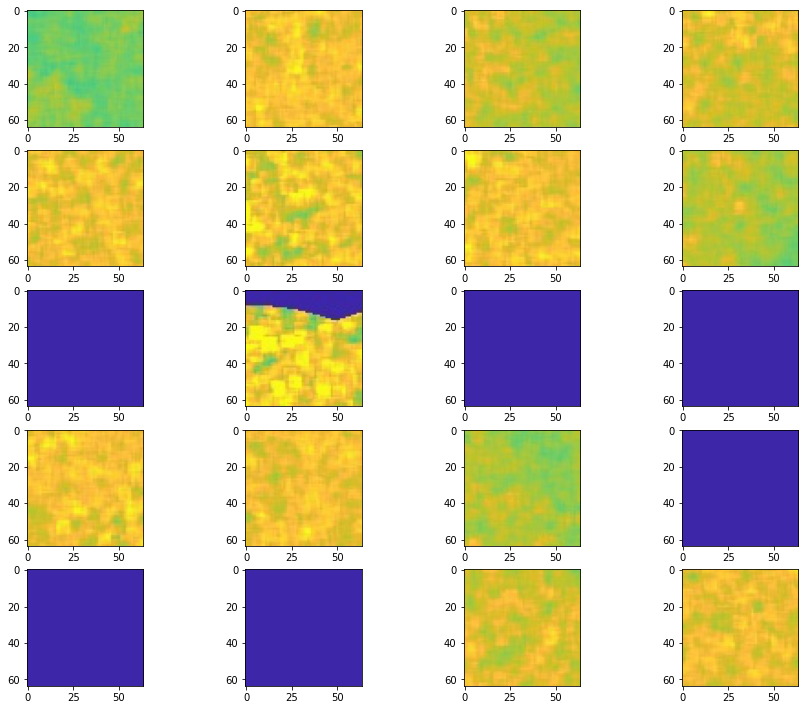

In [7]:
show_images(reconstructed)

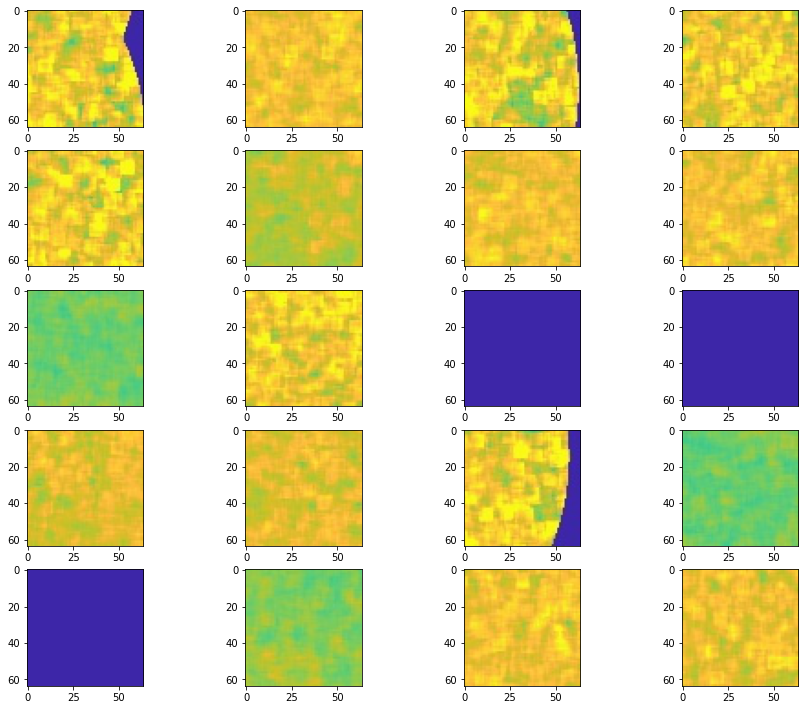

In [8]:
reconstructedTest = CustomImageDataset(img_dir=recon_dir_t)
show_images(reconstructedTest)

In [9]:
GT=dataGroundTruth[0][0]
R=reconstructed[0][0]
toTensor=transforms.ToTensor()
toPil=transforms.ToPILImage()

In [10]:
GT_=toTensor(GT)
print(GT_.shape)
R_=toTensor(R)
print(R_.shape)
def forwardMixing(groundTruthI,reconstructedI,t,T,device="cpu"):
    T = torch.ones_like(t)*T
    return ((T.to(device)-t.to(device))/T.to(device))*groundTruthI.to(device)+(t.to(device)/T.to(device))*reconstructedI.to(device),reconstructedI.to(device)

torch.Size([3, 64, 64])
torch.Size([3, 64, 64])


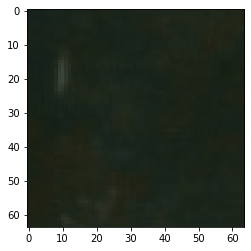

In [11]:
idx=30
t=torch.Tensor([idx]).type(torch.int64)
mixedImage,II=forwardMixing(GT_,R_,t,300)
RR=transforms.ToPILImage()(mixedImage)
plt.imshow(RR)
plt.show()

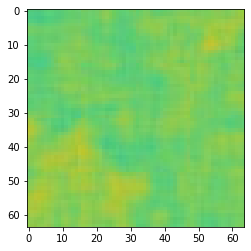

In [12]:
plt.imshow(R)
plt.show()

In [13]:
def linear_beta_schedule(timesteps, start=0.0001, end=0.02):
    return torch.linspace(start, end, timesteps)

def get_index_from_list(vals, t, x_shape):
    """ 
    Returns a specific index t of a passed list of values vals
    while considering the batch dimension.
    """
    batch_size = t.shape[0]
    out = vals.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

def forward_diffusion_sample(x_0, t, device="cpu"):
    """ 
    Takes an image and a timestep as input and 
    returns the noisy version of it
    """
    noise = torch.randn_like(x_0)
    sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x_0.shape
    )
    # mean + variance
    return sqrt_alphas_cumprod_t.to(device) * x_0.to(device) \
    + sqrt_one_minus_alphas_cumprod_t.to(device) * noise.to(device), noise.to(device)


# Define beta schedule
T = 300
betas = linear_beta_schedule(timesteps=T)

# Pre-calculate different terms for closed form
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

In [14]:
IMG_SIZE = 64
BATCH_SIZE = 64

def load_transformed_dataset(address):
    data_transforms = [
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(), # Scales data into [0,1] 
        transforms.Lambda(lambda t: (t * 2) - 1) # Scale between [-1, 1]
        #transforms.Grayscale() #Dara
    ]
    data_transform = transforms.Compose(data_transforms)     #unsqueeze(0) #Dara

    train = torchvision.datasets.StanfordCars(root=address, download=False, 
                                         transform=data_transform)

    test = torchvision.datasets.StanfordCars(root=address, download=False, 
                                         transform=data_transform, split='test')
    return torch.utils.data.ConcatDataset([train, test])
def show_tensor_image(image):
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1) / 2),
        transforms.Lambda(lambda t: t.permute(1, 2, 0)), # CHW to HWC
        transforms.Lambda(lambda t: t * 255.),
        transforms.Lambda(lambda t: t.numpy().astype(np.uint8)),
        transforms.ToPILImage()
        #transforms.Grayscale() #Dara
    ])

    # Take first image of batch
    if len(image.shape) == 4:
        image = image[0, :, :, :] 
    plt.imshow(reverse_transforms(image))

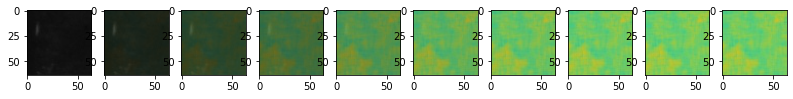

In [15]:
data_transforms = [
        transforms.ToTensor(), # Scales data into [0,1] 
        transforms.Lambda(lambda t: (t * 2) - 1) # Scale between [-1, 1]
    ]
data_transform = transforms.Compose(data_transforms)


reconstructed = CustomImageDataset(img_dir=recon_dir,transform=data_transform) 
dataGroundTruth = CustomImageDataset(img_dir=groundTruth_dir,transform=data_transform)

dataLoaderGT = DataLoader(dataGroundTruth, batch_size=BATCH_SIZE, shuffle=False, drop_last=True)
dataLoaderReconstructed = DataLoader(reconstructed, batch_size=BATCH_SIZE, shuffle=False, drop_last=True)

# Simulate forward diffusion
image = next(iter(dataLoaderGT))[0]
image_ = next(iter(dataLoaderReconstructed))[0]
T=300
plt.figure(figsize=(15,15))
plt.axis('off')
num_images = 10
stepsize = int(T/num_images)

for idx in range(0, T, stepsize):
    t = torch.Tensor([idx]).type(torch.int64)

    plt.subplot(1, num_images+1, int(idx/stepsize) + 1)
    image, noise = forwardMixing(image,image_, t,T)
    show_tensor_image(image)

In [16]:
dataLoaderG = DataLoader(dataGroundTruth, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)
for batchNumber, batchG in enumerate(dataLoaderG):
    break;

In [17]:
print(batchG[1])
print(len(batchG[1]))

tensor([2712, 2711, 3039,  546, 4198, 6025, 4204, 3006,  913, 1931, 3369, 1247,
        7589, 7704, 5294, 7861,   13, 7587, 7906,  446, 2427,   74, 6892, 2295,
        6640, 7824, 4671, 2636, 8116, 7599, 5895, 3863, 2459, 2341, 4071, 7059,
         121, 6177, 5707,  929, 3056,  373, 7989, 4012, 2764, 7730, 6362,  349,
        1821, 6856, 7322, 2868, 5529, 2018, 3390, 1168, 1172,  107, 3666, 2646,
        2060, 1811, 4002, 6293])
64


In [18]:
r=[reconstructed[label-1] for label in batchG[1].numpy()]
dataLoaderR = DataLoader(r, batch_size=BATCH_SIZE, shuffle=False, drop_last=True)

In [19]:
for batchNumber, batchR in enumerate(dataLoaderR):
    break

In [20]:
batchR[1]

tensor([2712, 2711, 3039,  546, 4198, 6025, 4204, 3006,  913, 1931, 3369, 1247,
        7589, 7704, 5294, 7861,   13, 7587, 7906,  446, 2427,   74, 6892, 2295,
        6640, 7824, 4671, 2636, 8116, 7599, 5895, 3863, 2459, 2341, 4071, 7059,
         121, 6177, 5707,  929, 3056,  373, 7989, 4012, 2764, 7730, 6362,  349,
        1821, 6856, 7322, 2868, 5529, 2018, 3390, 1168, 1172,  107, 3666, 2646,
        2060, 1811, 4002, 6293])

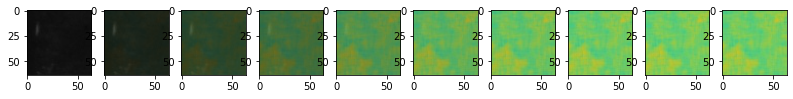

In [21]:
data_transforms = [
        transforms.ToTensor(), # Scales data into [0,1] 
        transforms.Lambda(lambda t: (t * 2) - 1) # Scale between [-1, 1]
    ]
data_transform = transforms.Compose(data_transforms)


reconstructed = CustomImageDataset(img_dir=recon_dir,transform=data_transform) 
dataGroundTruth = CustomImageDataset(img_dir=groundTruth_dir,transform=data_transform)

dataLoaderGT = DataLoader(dataGroundTruth, batch_size=BATCH_SIZE, shuffle=False, drop_last=True)
dataLoaderReconstructed = DataLoader(reconstructed, batch_size=BATCH_SIZE, shuffle=False, drop_last=True)


T=300
plt.figure(figsize=(15,15))
plt.axis('off')
num_images = 10
stepsize = int(T/num_images)
    
for ii in range(5):
    # Simulate forward diffusion
    image = next(iter(dataLoaderGT))[0]
    image_ = next(iter(dataLoaderReconstructed))[0]

    for idx in range(0, T, stepsize):
        t = torch.Tensor([idx]).type(torch.int64)

        plt.subplot((ii+1), num_images+1, int(idx/stepsize) + 1)
        image, noise = forwardMixing(image,image_, t,T)
        show_tensor_image(image)

In [22]:
class Block(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False):
        super().__init__()
        self.time_mlp =  nn.Linear(time_emb_dim, out_ch)
        if up:
            self.conv1 = nn.Conv2d(2*in_ch, out_ch, 3, padding=1)
            self.transform = nn.ConvTranspose2d(out_ch, out_ch, 4, 2, 1)
        else:
            self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
            self.transform = nn.Conv2d(out_ch, out_ch, 4, 2, 1)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.bnorm = nn.BatchNorm2d(out_ch)
        self.relu  = nn.ReLU()
        
    def forward(self, x, t, ):
        # First Conv
        h = self.bnorm(self.relu(self.conv1(x)))
        # Time embedding
        time_emb = self.relu(self.time_mlp(t))
        # Extend last 2 dimensions
        time_emb = time_emb[(..., ) + (None, ) * 2]
        # Add time channel
        h = h + time_emb
        # Second Conv
        h = self.bnorm(self.relu(self.conv2(h)))
        # Down or Upsample
        return self.transform(h)


class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings


class SimpleUnet(nn.Module):
    """
    A simplified variant of the Unet architecture.
    """
    def __init__(self):
        super().__init__()
        image_channels = 3
        down_channels = (64, 128, 256, 512, 1024)
        up_channels = (1024, 512, 256, 128, 64)
        out_dim = 1 
        out_channels=3
        time_emb_dim = 32

        # Time embedding
        self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(time_emb_dim),
                nn.Linear(time_emb_dim, time_emb_dim),
                nn.ReLU()
            )
        
        # Initial projection
        self.conv0 = nn.Conv2d(image_channels, down_channels[0], 3, padding=1)

        # Downsample
        self.downs = nn.ModuleList([Block(down_channels[i], down_channels[i+1], \
                                    time_emb_dim) \
                    for i in range(len(down_channels)-1)])
        # Upsample
        self.ups = nn.ModuleList([Block(up_channels[i], up_channels[i+1], \
                                        time_emb_dim, up=True) \
                    for i in range(len(up_channels)-1)])

        self.output = nn.Conv2d(up_channels[-1], out_channels, out_dim)

    def forward(self, x, timestep):
        # Embedd time
        t = self.time_mlp(timestep)
        # Initial conv
        x = self.conv0(x)
        # Unet
        residual_inputs = []
        for down in self.downs:
            x = down(x, t)
            residual_inputs.append(x)
        for up in self.ups:
            residual_x = residual_inputs.pop()
            # Add residual x as additional channels
            x = torch.cat((x, residual_x), dim=1)           
            x = up(x, t)
        return self.output(x)

model = SimpleUnet()
print("Num params: ", sum(p.numel() for p in model.parameters()))
model

Num params:  62433123


SimpleUnet(
  (time_mlp): Sequential(
    (0): SinusoidalPositionEmbeddings()
    (1): Linear(in_features=32, out_features=32, bias=True)
    (2): ReLU()
  )
  (conv0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (downs): ModuleList(
    (0): Block(
      (time_mlp): Linear(in_features=32, out_features=128, bias=True)
      (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): Conv2d(128, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bnorm): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (1): Block(
      (time_mlp): Linear(in_features=32, out_features=256, bias=True)
      (conv1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): Conv2d(256, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (conv2): Conv2d(256,

In [23]:
def get_loss(model, x_0, x_T, t, T):
    noise, x_noisy = forwardMixing(x_0,x_T, t, T, device) #
    noise_pred = model(x_noisy, t)
    return F.l1_loss(noise, noise_pred)

In [24]:
@torch.no_grad()
def sample_timestep(x, t):
    """
    Calls the model to predict the noise in the image and returns 
    the denoised image. 
    Applies noise to this image, if we are not in the last step yet.
    """
    betas_t = get_index_from_list(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x.shape
    )
    sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)
    
    # Call model (current image - noise prediction)
    model_mean = x - model(x, t)
    

    return model_mean


@torch.no_grad()
def sample_plot_image():
    # Sample noise
    
    data_transforms = [
        transforms.ToTensor(), # Scales data into [0,1] 
        transforms.Lambda(lambda t: (t * 2) - 1) # Scale between [-1, 1]
    ]
    data_transform = transforms.Compose(data_transforms)
    reconstructedTest = CustomImageDataset(img_dir=recon_dir_t,transform=data_transform) 
    index=random.randrange(64)
    
    img=reconstructedTest[index][0].unsqueeze(dim=0).to(device)

    plt.figure(figsize=(15,15))
    plt.axis('off')
    num_images = 10
    stepsize = int(T/num_images)

    for i in range(0,T)[::-1]:
        t = torch.full((1,), i, device=device, dtype=torch.long)
        img = sample_timestep(img, t)
        if i % stepsize == 0:
            plt.subplot(1, num_images, int(i/stepsize)+1)
            show_tensor_image(img.detach().cpu())
    plt.show()    

In [25]:
import os
CWD=os.getcwd()
directoryName='SavedModels_history'
path = os.path.join(CWD, directoryName)
if not os.path.exists(path):
    os.makedirs(path)
path=os.path.join(path, 'model.pth')

Epoch 0 | batchNumber 000 Loss: 0.52384352684021 


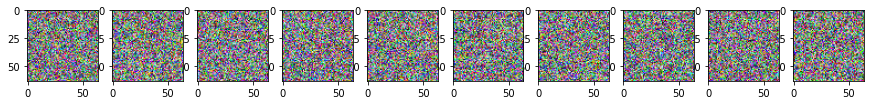

Epoch 5 | batchNumber 000 Loss: 0.22419695556163788 


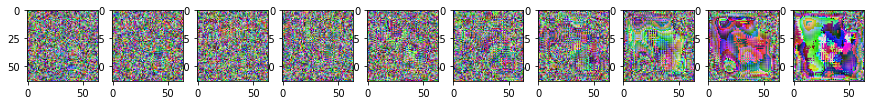

Epoch 10 | batchNumber 000 Loss: 0.23947304487228394 


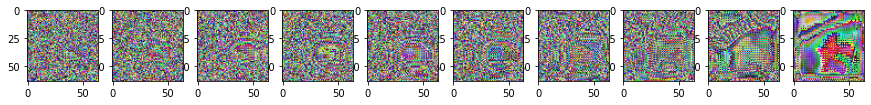

Epoch 15 | batchNumber 000 Loss: 0.19230183959007263 


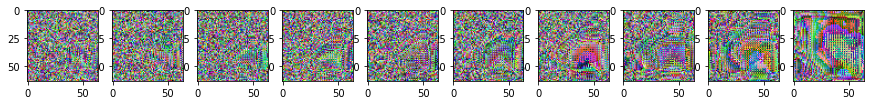

Epoch 20 | batchNumber 000 Loss: 0.21093909442424774 


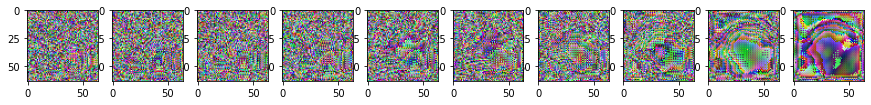

Epoch 25 | batchNumber 000 Loss: 0.19566631317138672 


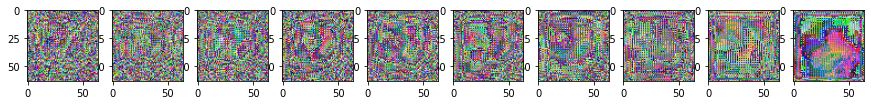

Epoch 30 | batchNumber 000 Loss: 0.22463397681713104 


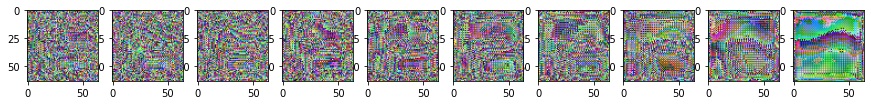

Epoch 35 | batchNumber 000 Loss: 0.19655835628509521 


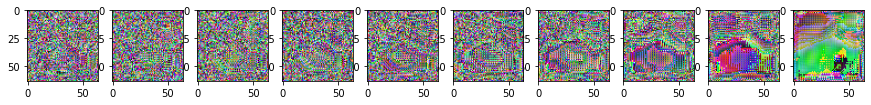

Epoch 40 | batchNumber 000 Loss: 0.21940980851650238 


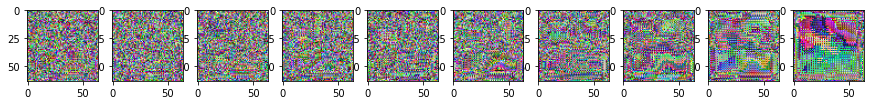

Epoch 45 | batchNumber 000 Loss: 0.17113123834133148 


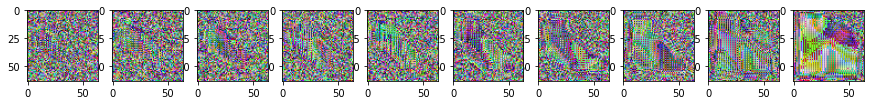

Epoch 50 | batchNumber 000 Loss: 0.17283862829208374 


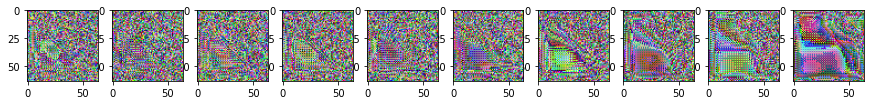

Epoch 55 | batchNumber 000 Loss: 0.19541046023368835 


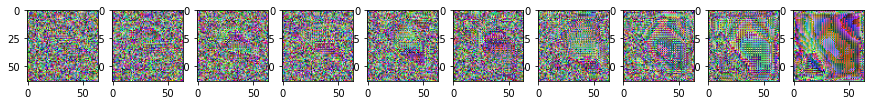

Epoch 60 | batchNumber 000 Loss: 0.20798218250274658 


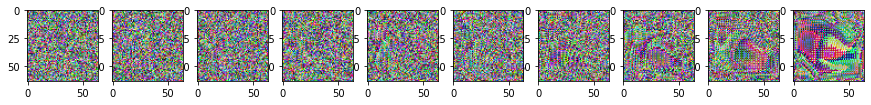

Epoch 65 | batchNumber 000 Loss: 0.21176259219646454 


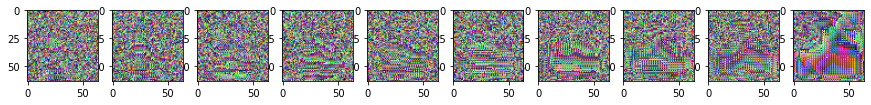

Epoch 70 | batchNumber 000 Loss: 0.18521088361740112 


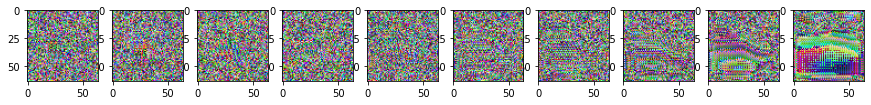

Epoch 75 | batchNumber 000 Loss: 0.20694738626480103 


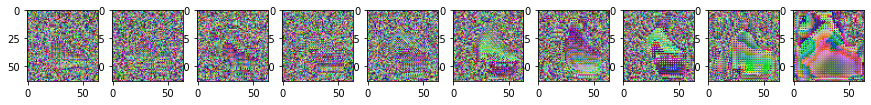

Epoch 80 | batchNumber 000 Loss: 0.18071632087230682 


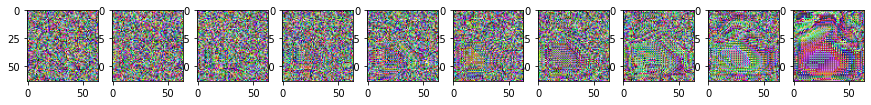

Epoch 85 | batchNumber 000 Loss: 0.17976698279380798 


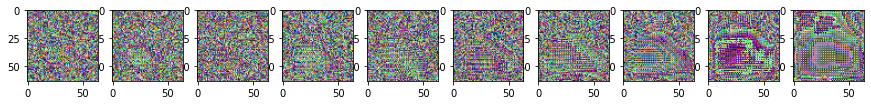

Epoch 90 | batchNumber 000 Loss: 0.21117477118968964 


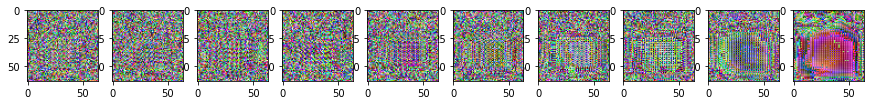

Epoch 95 | batchNumber 000 Loss: 0.22522234916687012 


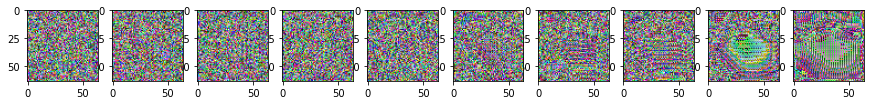

Epoch 100 | batchNumber 000 Loss: 0.21512383222579956 


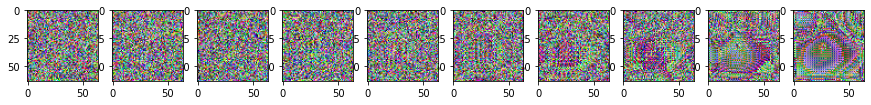

Epoch 105 | batchNumber 000 Loss: 0.18913130462169647 


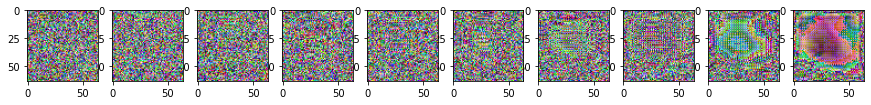

Epoch 110 | batchNumber 000 Loss: 0.18731968104839325 


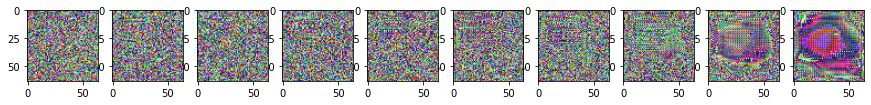

Epoch 115 | batchNumber 000 Loss: 0.2139829397201538 


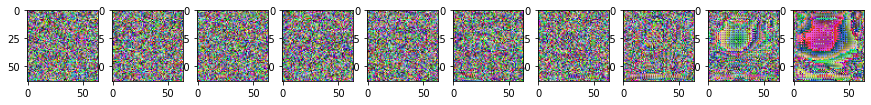

Epoch 120 | batchNumber 000 Loss: 0.17510569095611572 


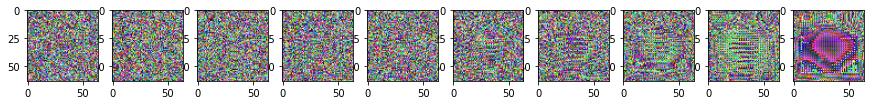

Epoch 125 | batchNumber 000 Loss: 0.19635681807994843 


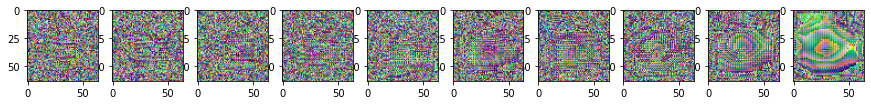

Epoch 130 | batchNumber 000 Loss: 0.18019187450408936 


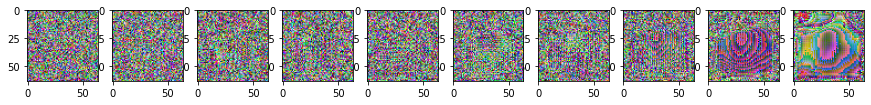

Epoch 135 | batchNumber 000 Loss: 0.1911896914243698 


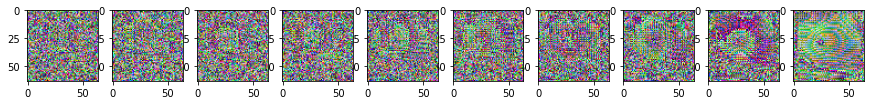

Epoch 140 | batchNumber 000 Loss: 0.1865273416042328 


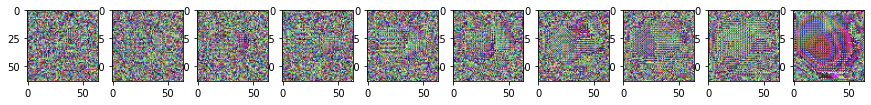

Epoch 145 | batchNumber 000 Loss: 0.18743166327476501 


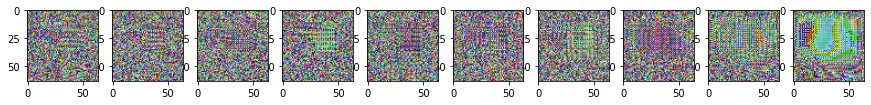

Epoch 150 | batchNumber 000 Loss: 0.16717800498008728 


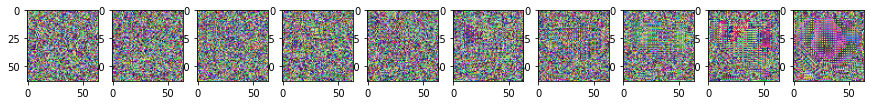

Epoch 155 | batchNumber 000 Loss: 0.1951800286769867 


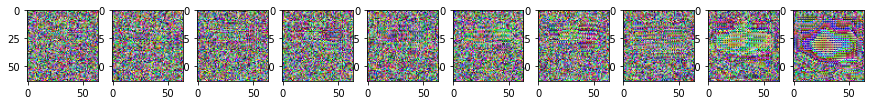

Epoch 160 | batchNumber 000 Loss: 0.17078638076782227 


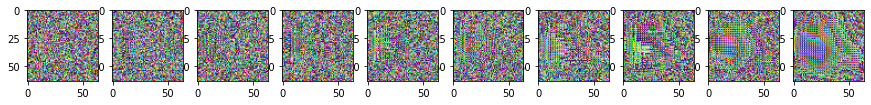

Epoch 165 | batchNumber 000 Loss: 0.18681567907333374 


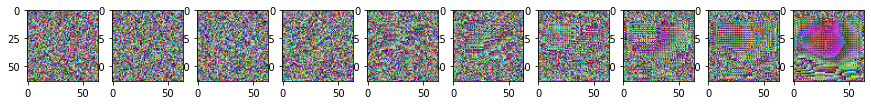

Epoch 170 | batchNumber 000 Loss: 0.19366149604320526 


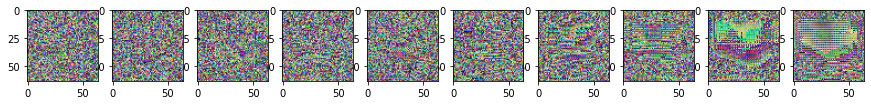

Epoch 175 | batchNumber 000 Loss: 0.183954656124115 


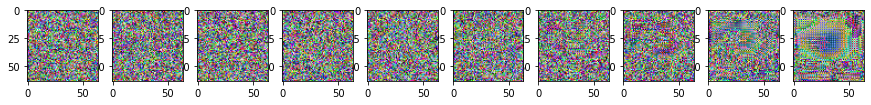

Epoch 180 | batchNumber 000 Loss: 0.18723735213279724 


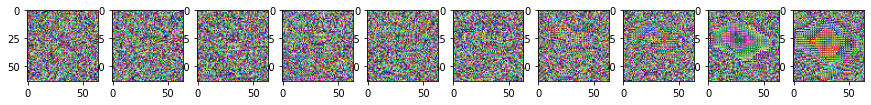

Epoch 185 | batchNumber 000 Loss: 0.17361752688884735 


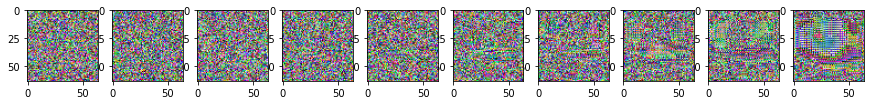

Epoch 190 | batchNumber 000 Loss: 0.18268752098083496 


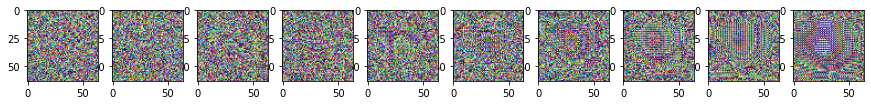

Epoch 195 | batchNumber 000 Loss: 0.1859750747680664 


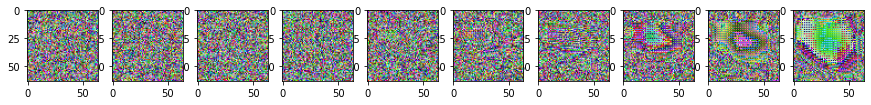

In [26]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
optimizer = Adam(model.parameters(), lr=0.01) #Dara Changed learning rate lr=0.01 or 0.1
epochs = 200 # Try more!


#Trackers:
lossList=[]

for epoch in range(epochs):
    for batchNumber, batchG in enumerate(dataLoaderG):
        r=[reconstructed[label-1] for label in batchG[1].numpy()]
        dataLoaderR = DataLoader(r, batch_size=BATCH_SIZE, shuffle=False, drop_last=True)
        batchR = next(iter(dataLoaderR))
        
        optimizer.zero_grad()
        
        t = torch.randint(0, T, (BATCH_SIZE,), device=device).long()
        loss = get_loss(model, batchG[0],batchR[0], t,T) #get_loss(model, x_0, x_T, t, T):
        loss.backward()
        optimizer.step()

        if epoch % 5 == 0 and batchNumber == 0:
            print(f"Epoch {epoch} | batchNumber {batchNumber:03d} Loss: {loss.item()} ")
            sample_plot_image()
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'loss': loss
                }, path)
            lossList.append(loss)

In [27]:
t.device

device(type='cuda', index=0)

In [28]:
T = torch.ones_like(t)*T

In [29]:
T.device

device(type='cuda', index=0)

In [30]:
groundTruthI.device

NameError: name 'groundTruthI' is not defined

In [ ]:
T-t